### Observations

##### 1) Comparison of MLP, Random Forest, and Logistic Regression

Using an MLP with two hidden layers of 100 neurons each yields an accuracy between 97-98% and an F1 score of 0.96-0.98. With a Random Forest classifier using 30 estimators, the accuracy reaches around 96%, with an F1 score in the range of 0.95-0.96. For a simple Logistic Regression model, the accuracy is approximately 93%, and the F1 score is between 0.9-0.93.

The confusion matrix reveals the most misclassified digit pairs as 7 and 1, 4 and 9, 7 and 2, 0 and 6, 2 and 8, 8 and 3, and 5 and 3. These digits have structural similarities that contribute to misclassifications. Even human perception can struggle with such distinctions, reflecting a potential baseline error rate for handwritten digit recognition models. Since the digits are handwritten, natural variation in how individuals write numbers also plays a role in these mispredictions.

##### 2) t-SNE Visualization for Untrained vs. Trained Model

In an untrained model, t-SNE visualizations do not reveal clear data clusters. Although some vague patterns may appear, this is likely due to inherent similarities within the data rather than model-specific learning, as the weights are still randomly initialized. This demonstrates t-SNE's ability to uncover subtle data structures even with random weights.

For a trained model, t-SNE shows distinct clusters by class, reflecting the model’s learned ability to capture features and trends in the data. Data points of the same class generally form specific clusters. Some misclassifications remain, shown by points in one cluster blending with another, indicating areas where the model struggles with certain distinctions.

##### 3) t-SNE Visualization for Fashion MNIST

With Fashion MNIST data and a model trained on MNIST, t-SNE shows clusters without sharply defined boundaries. Similar items tend to group together due to inherent similarities, but without explicit training on Fashion MNIST, the model lacks the precision to differentiate clusters as effectively as with MNIST.

Using a model trained on Fashion MNIST, t-SNE forms clearer clusters by class, indicating that the model has learned to capture meaningful patterns. However, the accuracy is slightly lower than with MNIST, resulting in more overlap between clusters due to less distinct class separation in the plot.

### Training MLP on MNIST

In [1]:
import torch
import numpy as np
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt
%matplotlib inline
# %matplotlib widget
%config InlineBackend.figure_format = 'retina'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
'''
By default the the data is in form of tuples where the first element is image in PIL and
the second object is its label. By applying the transform operation we are converting it
into tuple of tensor image and label. To convert the images by looping then  the following code may help.
Otherwise pass the transform argument which will be applied to the whole dataset.

What are the benefits of using the dataloader and dataset.mnist direct rather than importing explicitly.
Here the data is already normalized and it is easy to maintain the data using the torch utility rather
than doing it explicitly.
'''



'''
Data Loading Order and Sampler
For iterable-style datasets, data loading order is entirely controlled by the user-defined iterable.
 This allows easier implementations of chunk-reading and dynamic batch size (e.g., by yielding a batched sample at each time).

The rest of this section concerns the case with map-style datasets. torch.utils.data.Sampler classes are
used to specify the sequence of indices/keys used in data loading. They represent iterable objects over
the indices to datasets. E.g., in the common case with stochastic gradient decent (SGD), a Sampler could
randomly permute a list of indices and yield each one at a time, or yield a small number of them for mini-batch SGD.

A sequential or shuffled sampler will be automatically constructed based on the shuffle argument to a DataLoader.
Alternatively, users may use the sampler argument to specify a custom Sampler object that at each time yields the next index/key to fetch.

A custom Sampler that yields a list of batch indices at a time can be passed as the batch_sampler argument.
 Automatic batching can also be enabled via batch_size and drop_last arguments. See the next section for more details on this.
'''

transform = transforms.ToTensor()
train_data = datasets.MNIST(root = 'data', train = True, download = True,transform=transform)
test_data = datasets.MNIST(root = 'data', train = False, download = True,transform=transform)

In [3]:
# for image,label in train_data:
    # print(type(image))
    # print(transform(image),label)

In [4]:
# for image,label in test_data:
    # print(type(image))
    # print(transform(image),label)

In [5]:
'''
Here we dont need to scale teh images between 0 to 1 because they are already normalized
in the mnist data provided by the torch library.

Moving on now we need to shuffle the data. We have test and train sets. Now we will create
validation set from training examples.
To do so we will use np.random.permutation.

Here I am exploring the dataloaders from the torch. So what is a dataloader. It is a utility
in torch that helps in batching,shuffling and parallelism of the data.

Samplers: A sampler in pytorch samples form the dataset according to the provided criteria.
Here i will be using a sampler to divide the data into train and validation parts.


In the following outputs we can see that the train loader has length of 657. Our batch size if 64
so 64x657 = 0.7 * 60000 approx. So the train loader divides the train data and the validation data
in multiple batches of size 64.
'''

samples = len(train_data)
index = np.random.permutation(samples)

split = int(np.floor(0.3*samples))
train_idxs  ,valid_idxs = index[split:],index[:split]

train_sampler = SubsetRandomSampler(train_idxs)
valid_sampler = SubsetRandomSampler(valid_idxs)

batch_size = 64
num_workers = 0

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, sampler=train_sampler, num_workers=num_workers)
valid_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, sampler=valid_sampler, num_workers=num_workers)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, num_workers=num_workers)


In [6]:
print(len(train_loader))

657


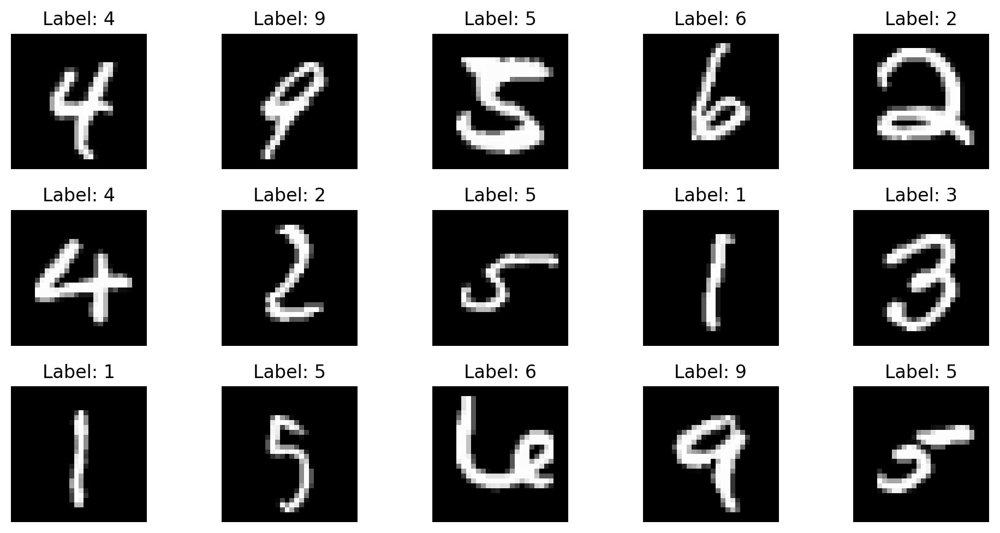

In [7]:
'''
Visualizing the data from the first batch.


How to create an iterator and what are next and iter ??

iter creates an iterator for any object so passing in the index will give the next object for it.

next object retrieves the next item from an iterator

'''

images, labels = next(iter(train_loader))

fig, axes = plt.subplots(3, 5, figsize=(10, 5))
axes = axes.flatten()

for i in range(15):
    axes[i].imshow(images[i].squeeze(), cmap='gray')
    axes[i].set_title(f'Label: {labels[i].item()}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [8]:
'''
Defining the architecture of the model.

'''

import torch
from torch import nn
import torch.nn.functional as F
from torchsummary import summary


class MLP(nn.Module):
    def __init__(self,hidden_1,hidden_2):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(28*28, hidden_1)
        self.fc2 = nn.Linear(hidden_1, hidden_2)
        self.fc3 = nn.Linear(hidden_2, 10)

    def forward(self, x):
        x = x.view(-1, 28*28)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

model = MLP(30,20).to(device)
summary(model, input_size=(1, 28, 28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 30]          23,550
            Linear-2                   [-1, 20]             620
            Linear-3                   [-1, 10]             210
Total params: 24,380
Trainable params: 24,380
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.09
Estimated Total Size (MB): 0.10
----------------------------------------------------------------


In [9]:
'''
Setting up the optimizer and the loss function
'''
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [10]:
'''
Now we will train the model.
'''

epochs = 100

for epoch in range(epochs):
    model.train()
    curr_loss = 0.0

    for images, labels in train_loader:
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        curr_loss += loss.item()

    # Calculate average loss for this epoch
    avg_loss = curr_loss / len(train_loader)
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')

    # Validation step
    model.eval()  # Set the model to evaluation mode
    correct = 0
    total = 0

    with torch.no_grad():  # No gradient calculation during validation
        for images, labels in valid_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            # print(outputs.shape)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    validation_accuracy = correct / total
    print(f'Validation Accuracy: {validation_accuracy:.4f}')

# Optionally, you can save the model after training
torch.save(model.state_dict(), 'mlp_mnist.pth')

Epoch [1/100], Loss: 0.5831
Validation Accuracy: 0.9172
Epoch [2/100], Loss: 0.2719
Validation Accuracy: 0.9324
Epoch [3/100], Loss: 0.2237
Validation Accuracy: 0.9378
Epoch [4/100], Loss: 0.1936
Validation Accuracy: 0.9433
Epoch [5/100], Loss: 0.1726
Validation Accuracy: 0.9482
Epoch [6/100], Loss: 0.1560
Validation Accuracy: 0.9480
Epoch [7/100], Loss: 0.1425
Validation Accuracy: 0.9512
Epoch [8/100], Loss: 0.1325
Validation Accuracy: 0.9476
Epoch [9/100], Loss: 0.1238
Validation Accuracy: 0.9557
Epoch [10/100], Loss: 0.1142
Validation Accuracy: 0.9551
Epoch [11/100], Loss: 0.1075
Validation Accuracy: 0.9556
Epoch [12/100], Loss: 0.1017
Validation Accuracy: 0.9583
Epoch [13/100], Loss: 0.0965
Validation Accuracy: 0.9583
Epoch [14/100], Loss: 0.0895
Validation Accuracy: 0.9572
Epoch [15/100], Loss: 0.0869
Validation Accuracy: 0.9559
Epoch [16/100], Loss: 0.0824
Validation Accuracy: 0.9563
Epoch [17/100], Loss: 0.0778
Validation Accuracy: 0.9562
Epoch [18/100], Loss: 0.0736
Validation 

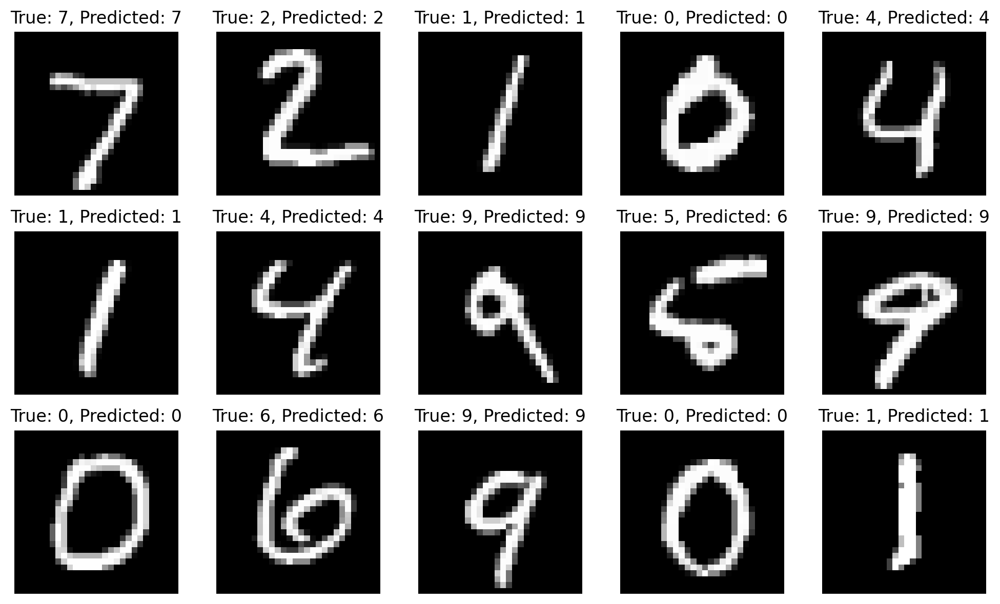

In [11]:
model.eval()

with torch.no_grad():

    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)

        fig, axes = plt.subplots(3, 5, figsize=(10, 6))
        axes = axes.flatten()

        for i in range(15):
            axes[i].imshow(images[i].cpu().squeeze(), cmap='gray')
            axes[i].set_title(f'True: {labels[i].item()}, Predicted: {predicted[i].item()}')
            axes[i].axis('off')

        plt.tight_layout()
        plt.show()

        break

In [12]:
model.load_state_dict(torch.load('mlp_mnist.pth'))

/tmp/ipykernel_6856/3042003745.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('mlp_mnist.pth'))


<All keys matched successfully>

Test Accuracy: 0.9573
F1 Score: 0.9573
Confusion Matrix:
Macro Precision Score:  0.9572437672980927
Micro Precision Score:  0.9572437672980927
Weighted Precision Score:  0.9577112393947311


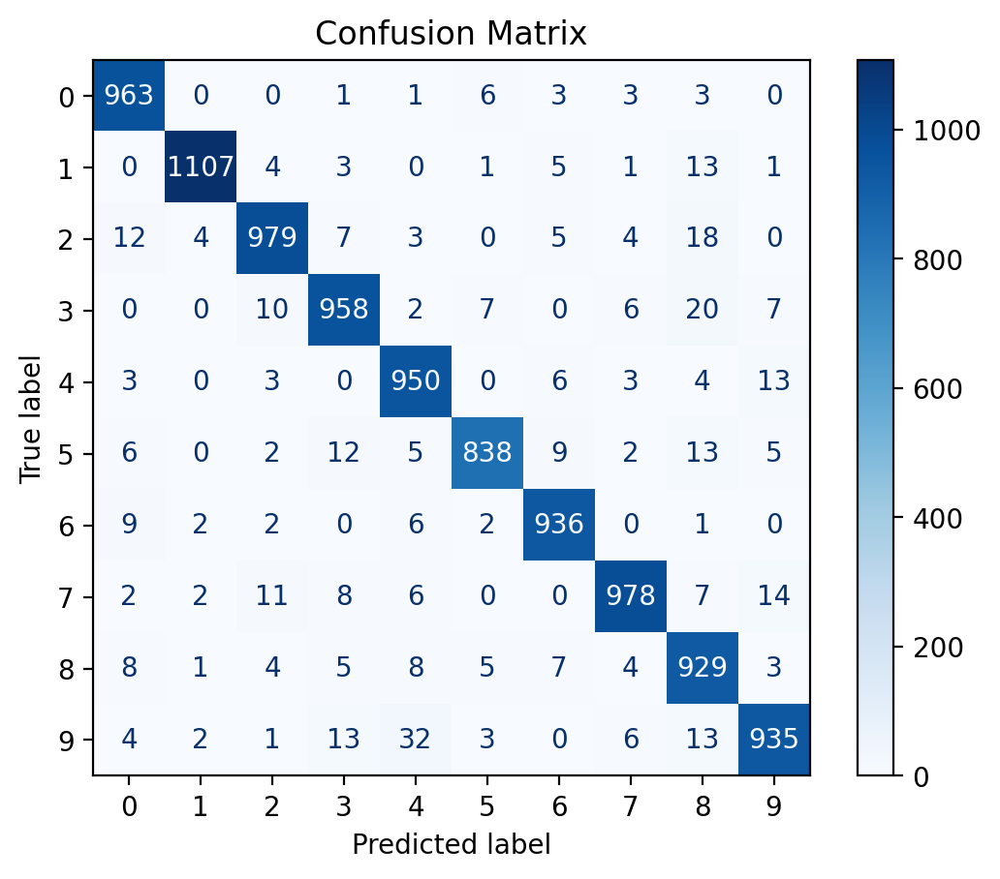

In [13]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, confusion_matrix, precision_score
import pandas as pd

model.eval()
correct = 0
total = 0

all_labels = []
all_predictions = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        # print(outputs)
        max_logits, predicted = torch.max(outputs.data, 1)
        # print()

        total += labels.size(0)
        correct += (predicted == labels.squeeze()).sum().item()

        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())


test_accuracy = correct / total
print(f'Test Accuracy: {test_accuracy:.4f}')

f1 = f1_score(all_labels, all_predictions, average='weighted')
print(f'F1 Score: {f1:.4f}')

conf = confusion_matrix(all_labels, all_predictions)
print('Confusion Matrix:')

precision_macro = precision_score(all_labels,all_predictions,average='macro')
print("Macro Precision Score: ",precision_macro)

precision_micro = precision_score(all_labels,all_predictions,average='macro')
print("Micro Precision Score: ",precision_micro)

precision_weighted = precision_score(all_labels,all_predictions,average="weighted")
print("Weighted Precision Score: ",precision_weighted)



disp = ConfusionMatrixDisplay(confusion_matrix=conf)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


In [14]:
model1 = MLP(100,100).to(device)
summary(model1, input_size=(1, 28, 28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 100]          78,500
            Linear-2                  [-1, 100]          10,100
            Linear-3                   [-1, 10]           1,010
Total params: 89,610
Trainable params: 89,610
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.34
Estimated Total Size (MB): 0.35
----------------------------------------------------------------


In [15]:
# Training MLP model1 for MNIST
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model1.parameters(), lr=0.001)

'''
Now we will train the model1.
'''

epochs = 100

for epoch in range(epochs):
    model1.train()
    curr_loss = 0.0

    for images, labels in train_loader:
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        outputs = model1(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        curr_loss += loss.item()

    # Calculate average loss for this epoch
    avg_loss = curr_loss / len(train_loader)
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')

    # Validation step
    model1.eval()  # Set the model1 to evaluation mode
    correct = 0
    total = 0

    with torch.no_grad():  # No gradient calculation during validation
        for images, labels in valid_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model1(images)
            # print(outputs.shape)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    validation_accuracy = correct / total
    print(f'Validation Accuracy: {validation_accuracy:.4f}')

# Optionally, you can save the model1 after training
# torch.save(model1.state_dict(), 'mlp_mnist.pth')

Epoch [1/100], Loss: 0.3998
Validation Accuracy: 0.9404
Epoch [2/100], Loss: 0.1698
Validation Accuracy: 0.9555
Epoch [3/100], Loss: 0.1223
Validation Accuracy: 0.9609
Epoch [4/100], Loss: 0.0940
Validation Accuracy: 0.9671
Epoch [5/100], Loss: 0.0736
Validation Accuracy: 0.9714
Epoch [6/100], Loss: 0.0592
Validation Accuracy: 0.9693
Epoch [7/100], Loss: 0.0482
Validation Accuracy: 0.9704
Epoch [8/100], Loss: 0.0397
Validation Accuracy: 0.9723
Epoch [9/100], Loss: 0.0323
Validation Accuracy: 0.9732
Epoch [10/100], Loss: 0.0252
Validation Accuracy: 0.9739
Epoch [11/100], Loss: 0.0236
Validation Accuracy: 0.9756
Epoch [12/100], Loss: 0.0198
Validation Accuracy: 0.9736
Epoch [13/100], Loss: 0.0201
Validation Accuracy: 0.9745
Epoch [14/100], Loss: 0.0138
Validation Accuracy: 0.9743
Epoch [15/100], Loss: 0.0115
Validation Accuracy: 0.9750
Epoch [16/100], Loss: 0.0124
Validation Accuracy: 0.9744
Epoch [17/100], Loss: 0.0111
Validation Accuracy: 0.9734
Epoch [18/100], Loss: 0.0099
Validation 

Test Accuracy: 0.9773
F1 Score: 0.9773
Confusion Matrix:
Macro Precision Score:  0.9771271931255571
Micro Precision Score:  0.9771271931255571
Weighted Precision Score:  0.9774330041246574


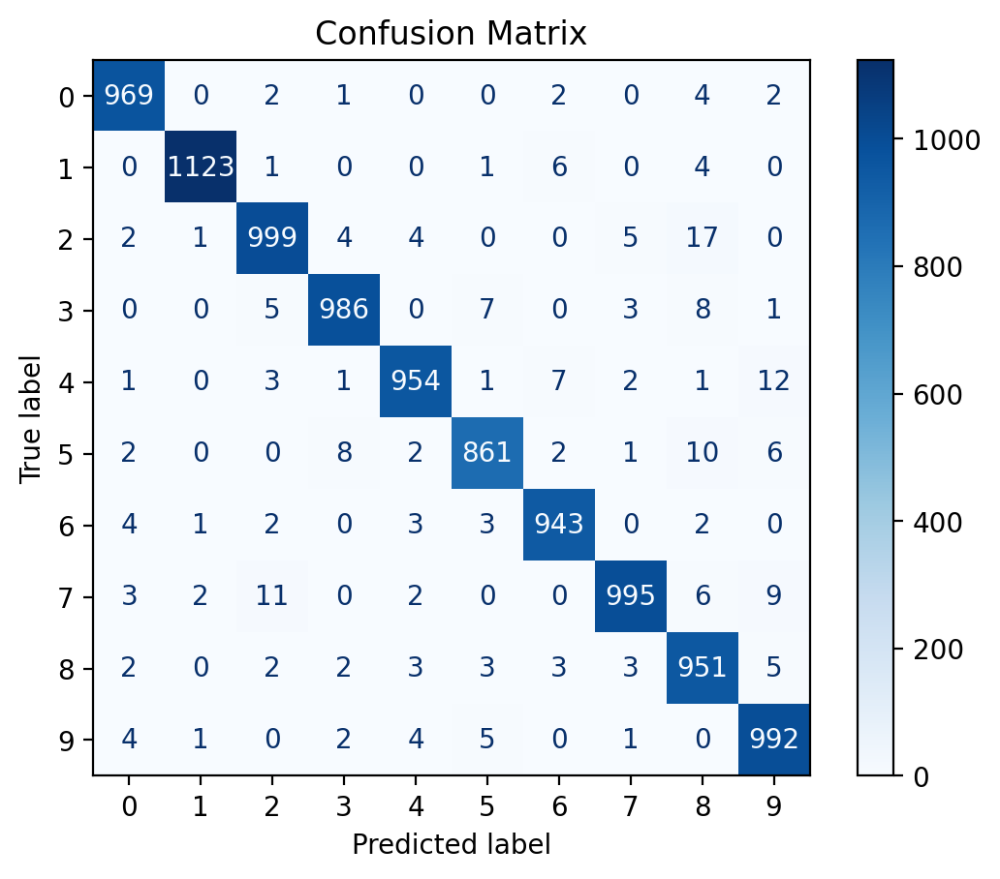

In [16]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, confusion_matrix
import pandas as pd

model1.eval()
correct = 0
total = 0

all_labels = []
all_predictions = []
all_inputs = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model1(images)
        # print(outputs)
        max_logits, predicted = torch.max(outputs.data, 1)
        # print()

        total += labels.size(0)
        correct += (predicted == labels.squeeze()).sum().item()
        all_inputs.extend(images.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())


test_accuracy = correct / total
print(f'Test Accuracy: {test_accuracy:.4f}')

f1 = f1_score(all_labels, all_predictions, average='weighted')
print(f'F1 Score: {f1:.4f}')

conf = confusion_matrix(all_labels, all_predictions)
print('Confusion Matrix:')



precision_macro = precision_score(all_labels,all_predictions,average='macro')
print("Macro Precision Score: ",precision_macro)

precision_micro = precision_score(all_labels,all_predictions,average='macro')
print("Micro Precision Score: ",precision_micro)

precision_weighted = precision_score(all_labels,all_predictions,average="weighted")
print("Weighted Precision Score: ",precision_weighted)


disp = ConfusionMatrixDisplay(confusion_matrix=conf)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


In [17]:
filtered_labels =[]
filtered_preds = []
filtered_inputs = []
for i in range(len(all_labels)):
    if all_labels[i] != all_predictions[i]:
        filtered_inputs.append(all_inputs[i])
        filtered_labels.append(all_labels[i])
        filtered_preds.append(all_predictions[i])

filtered_inputs = np.array(filtered_inputs)
filtered_labels = np.array(filtered_labels)
filtered_preds = np.array(filtered_preds)

        

227
227
227


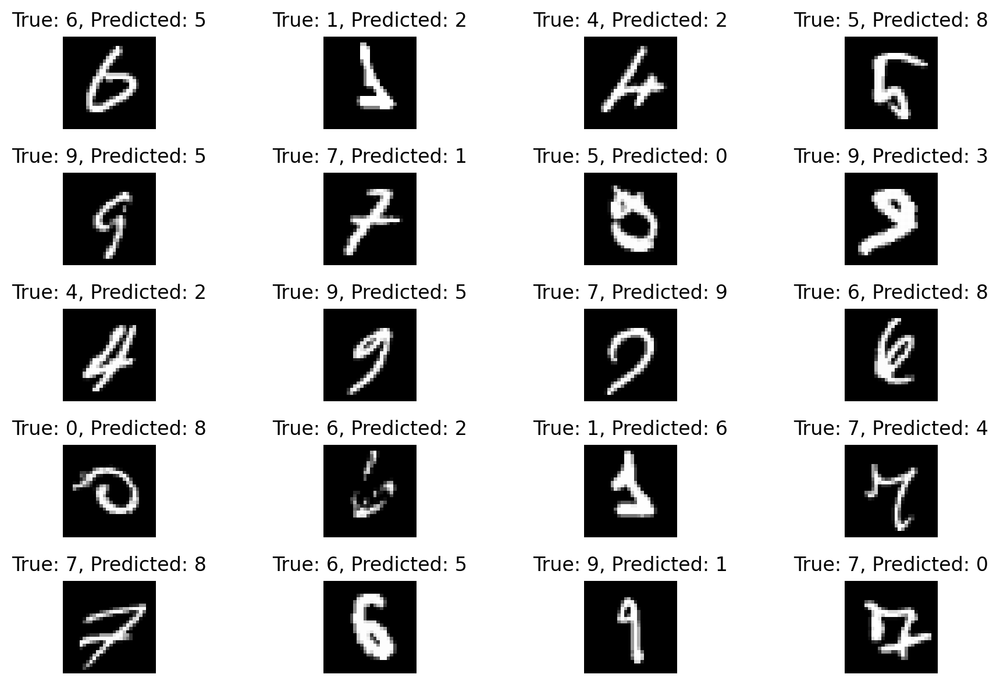

In [18]:
print(len(filtered_inputs))
print(len(filtered_preds))
print(len(filtered_labels))

samples = 20
idx = np.random.permutation(len(filtered_inputs))
# print(idx)

plot_labels = filtered_labels[idx]
plot_preds = filtered_preds[idx]
plot_img = filtered_inputs[idx]

fig, axes = plt.subplots(5, 4, figsize=(10, 6))
axes = axes.flatten()

for i in range(samples):
    axes[i].imshow(plot_img[i].squeeze(), cmap='gray')
    axes[i].set_title(f'True: {plot_labels[i]}, Predicted: {plot_preds[i]}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()


### Training RF on MNIST

In [19]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, confusion_matrix,accuracy_score
import pandas as pd

X_train = []
Y_train = []
X_valid = []
Y_valid = []
X_test = []
Y_test = []

for images, labels in train_loader:
    X_train.extend(images.numpy())
    Y_train.extend(labels.numpy())

X_train = np.array(X_train)
Y_train = np.array(Y_train)

for images, labels in valid_loader:
    X_valid.extend(images.numpy())
    Y_valid.extend(labels.numpy())

X_valid = np.array(X_valid)
Y_valid = np.array(Y_valid)

for images, labels in test_loader:
    X_test.extend(images.numpy())
    Y_test.extend(labels.numpy())

X_test = np.array(X_test)
Y_test = np.array(Y_test)


classifier = RandomForestClassifier(n_estimators=30, random_state=42)
classifier.fit(X_train.reshape(X_train.shape[0], -1), Y_train)


RandomForestClassifier(n_estimators=30, random_state=42)

Accuracy on Validation set is  0.9602777777777778
Accuracy on test set is  0.9614
F1 Score: 0.9613
Macro Precision Score:  0.9771271931255571
Micro Precision Score:  0.9771271931255571
Weighted Precision Score:  0.9774330041246574
Confusion Matrix:


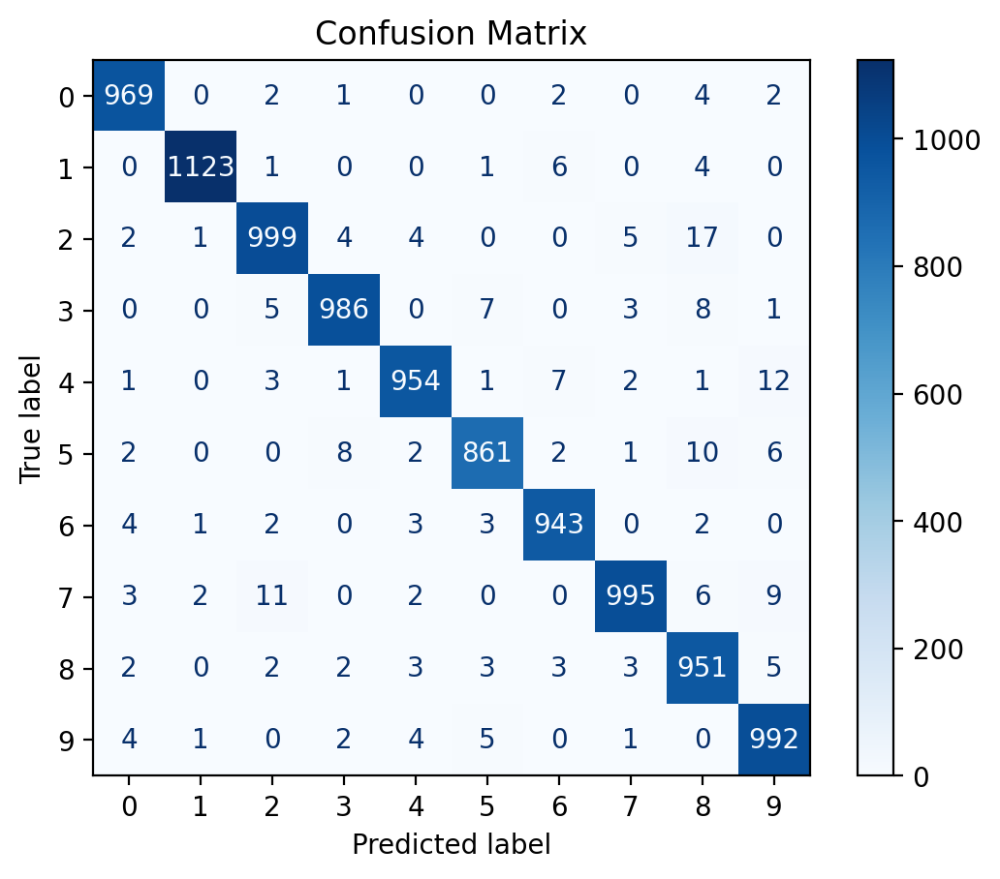

In [20]:
Y_valid_pred = classifier.predict(X_valid.reshape(X_valid.shape[0],-1))
accuracy = accuracy_score(Y_valid,Y_valid_pred)
print("Accuracy on Validation set is ",accuracy)

Y_pred = classifier.predict(X_test.reshape(X_test.shape[0], -1))
accuracy = accuracy_score(Y_pred,Y_test)
print("Accuracy on test set is ",accuracy)

f1 = f1_score(Y_test, Y_pred, average='weighted')
conf_matrix = confusion_matrix(Y_test, Y_pred)

print(f'F1 Score: {f1:.4f}')
# print('Confusion Matrix:')
# display(pd.DataFrame(conf_matrix))


precision_macro = precision_score(all_labels,all_predictions,average='macro')
print("Macro Precision Score: ",precision_macro)

precision_micro = precision_score(all_labels,all_predictions,average='macro')
print("Micro Precision Score: ",precision_micro)

precision_weighted = precision_score(all_labels,all_predictions,average="weighted")
print("Weighted Precision Score: ",precision_weighted)



conf = confusion_matrix(all_labels, all_predictions)
print('Confusion Matrix:')

disp = ConfusionMatrixDisplay(confusion_matrix=conf)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

### Training Logistic Regg on MNIST

In [21]:
import torch
import torch.nn as nn

class LogisticRegression(nn.Module):
    def __init__(self, input_size=784):
        super(LogisticRegression, self).__init__()
        self.linear = nn.Linear(input_size, 10)

    def forward(self, x):
        x = x.view(-1, 28 * 28)
        return self.linear(x)

In [22]:
modelLR = LogisticRegression().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(modelLR.parameters(), lr=0.001)

In [23]:
'''
Now we will train the modelLR.
'''

epochs = 100

for epoch in range(epochs):
    modelLR.train()
    curr_loss = 0.0

    for images, labels in train_loader:
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        outputs = modelLR(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        curr_loss += loss.item()

    # Calculate average loss for this epoch
    avg_loss = curr_loss / len(train_loader)
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')

    # Validation step
    modelLR.eval()  # Set the modelLR to evaluation mode
    correct = 0
    total = 0

    with torch.no_grad():  # No gradient calculation during validation
        for images, labels in valid_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = modelLR(images)
            # print(outputs.shape)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    validation_accuracy = correct / total
    print(f'Validation Accuracy: {validation_accuracy:.4f}')


Epoch [1/100], Loss: 0.6237
Validation Accuracy: 0.9001
Epoch [2/100], Loss: 0.3517
Validation Accuracy: 0.9111
Epoch [3/100], Loss: 0.3145
Validation Accuracy: 0.9162
Epoch [4/100], Loss: 0.2964
Validation Accuracy: 0.9174
Epoch [5/100], Loss: 0.2852
Validation Accuracy: 0.9204
Epoch [6/100], Loss: 0.2777
Validation Accuracy: 0.9209
Epoch [7/100], Loss: 0.2729
Validation Accuracy: 0.9246
Epoch [8/100], Loss: 0.2676
Validation Accuracy: 0.9248
Epoch [9/100], Loss: 0.2636
Validation Accuracy: 0.9250
Epoch [10/100], Loss: 0.2607
Validation Accuracy: 0.9236
Epoch [11/100], Loss: 0.2577
Validation Accuracy: 0.9241
Epoch [12/100], Loss: 0.2554
Validation Accuracy: 0.9258
Epoch [13/100], Loss: 0.2535
Validation Accuracy: 0.9262
Epoch [14/100], Loss: 0.2514
Validation Accuracy: 0.9258
Epoch [15/100], Loss: 0.2501
Validation Accuracy: 0.9273
Epoch [16/100], Loss: 0.2483
Validation Accuracy: 0.9264
Epoch [17/100], Loss: 0.2461
Validation Accuracy: 0.9263
Epoch [18/100], Loss: 0.2447
Validation 

Test Accuracy: 0.9266
F1 Score: 0.9266
Macro Precision Score:  0.9257068439879866
Micro Precision Score:  0.9257068439879866
Weighted Precision Score:  0.9266769560324929
Confusion Matrix:


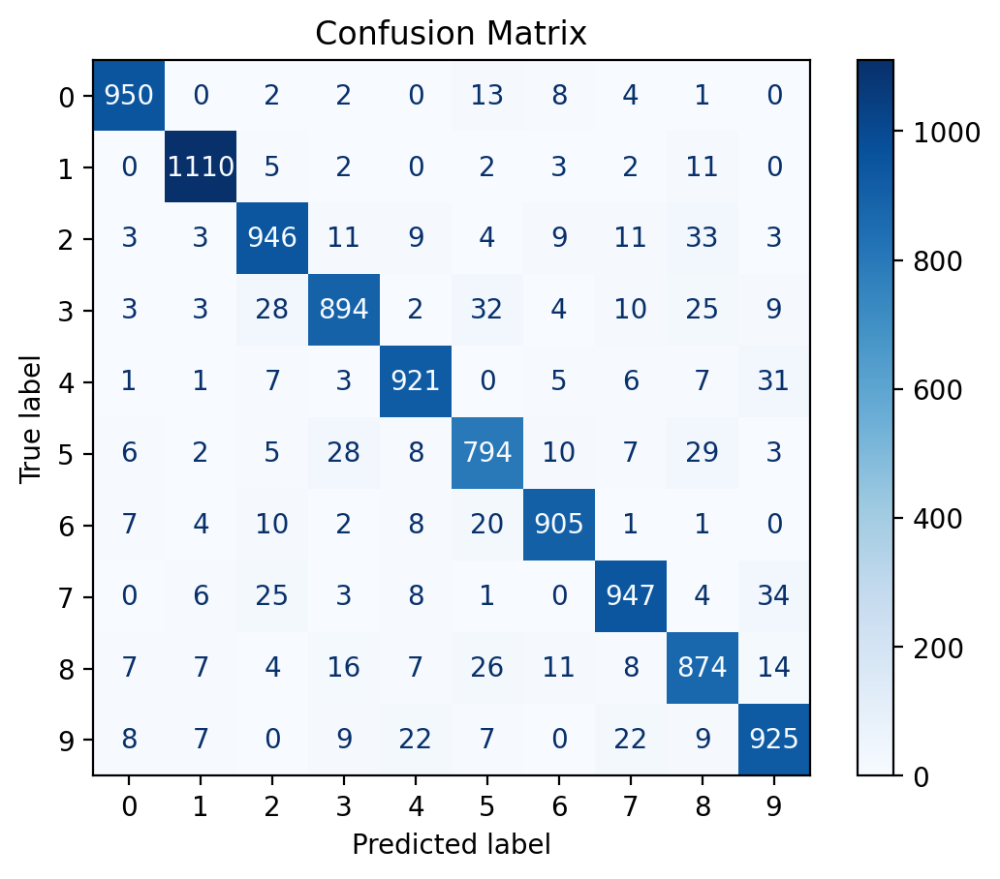

In [24]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, confusion_matrix
import pandas as pd

modelLR.eval()
correct = 0
total = 0

all_labels = []
all_predictions = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = modelLR(images)
        # print(outputs)
        max_logits, predicted = torch.max(outputs.data, 1)
        # print()

        total += labels.size(0)
        correct += (predicted == labels.squeeze()).sum().item()

        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())


test_accuracy = correct / total
print(f'Test Accuracy: {test_accuracy:.4f}')

f1 = f1_score(all_labels, all_predictions, average='weighted')
print(f'F1 Score: {f1:.4f}')


precision_macro = precision_score(all_labels,all_predictions,average='macro')
print("Macro Precision Score: ",precision_macro)

precision_micro = precision_score(all_labels,all_predictions,average='macro')
print("Micro Precision Score: ",precision_micro)

precision_weighted = precision_score(all_labels,all_predictions,average="weighted")
print("Weighted Precision Score: ",precision_weighted)


conf = confusion_matrix(all_labels, all_predictions)
print('Confusion Matrix:')

disp = ConfusionMatrixDisplay(confusion_matrix=conf)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


### Comparing t-SNE for trained , untrained and trianed model with Fashion MNIST

In [25]:
'''
TSNE : t distributed stochastic neighbour embedding
t-distributed : the algorithm uses a distribution called t-distribution
                it is like normal distribution but less value at mean and the
                flaps are bit higher. This ensures the mapping does result into clusters
                not centered at one point.

stochastic : It is due to the random nature of the algorithm. The embedding process involves random initialization
            and random sampling. So different runs give different results.

neighbour : Refers to the distance property that is retained during the processing of data. It tries to locate the
            neighbours in lowers dimension based on their relative distances in higher dimension.

embedding : transforming the data from higher dimensional space to lower dimensional space. In general embedding means to
            encode data in some format.

'''


'\nTSNE : t distributed stochastic neighbour embedding\nt-distributed : the algorithm uses a distribution called t-distribution\n                it is like normal distribution but less value at mean and the\n                flaps are bit higher. This ensures the mapping does result into clusters\n                not centered at one point.\n\nstochastic : It is due to the random nature of the algorithm. The embedding process involves random initialization\n            and random sampling. So different runs give different results.\n\nneighbour : Refers to the distance property that is retained during the processing of data. It tries to locate the\n            neighbours in lowers dimension based on their relative distances in higher dimension.\n\nembedding : transforming the data from higher dimensional space to lower dimensional space. In general embedding means to\n            encode data in some format.\n\n'

In [26]:
model_ut = MLP(30, 20).to(device)

model.eval()
model_ut.eval()

outputs_layer2 = []
outputs_layer2_ut = []
ylabels = []

with torch.no_grad():
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        for image, label in zip(images, labels):
            x = image.view(-1, 28 * 28).to(device)

            out = F.relu(model.fc1(x))
            outputs_layer2.append(model.fc2(out).cpu().squeeze().numpy())
            ylabels.append(label.cpu().numpy())

            out_ut = F.relu(model_ut.fc1(x))
            outputs_layer2_ut.append(model_ut.fc2(out_ut).cpu().squeeze().numpy())




In [27]:
samples = -1
outputs_layer2 = np.array(outputs_layer2[:samples])
ylabels = np.array(ylabels[:samples])
outputs_layer2_ut = np.array(outputs_layer2_ut[:samples])

print(outputs_layer2.shape)

(41999, 20)


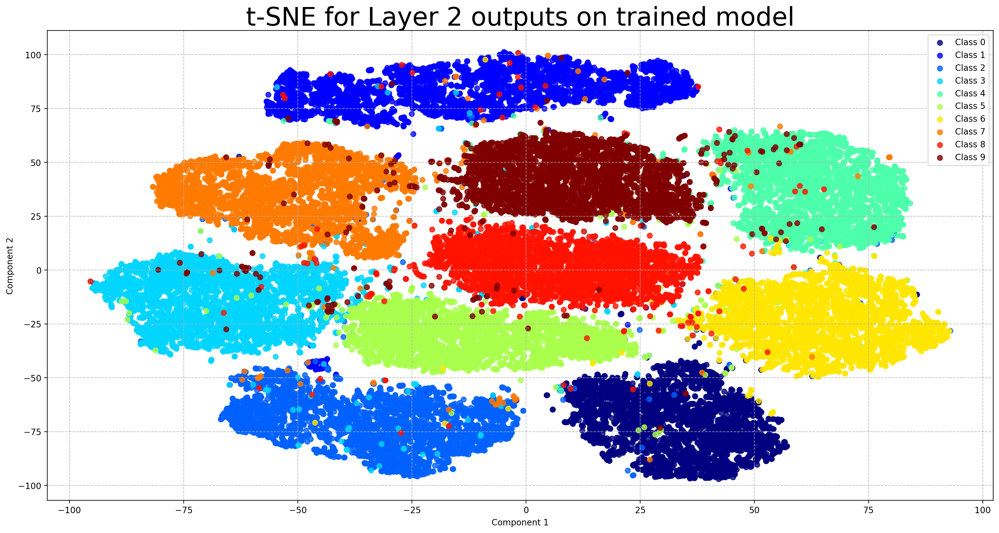

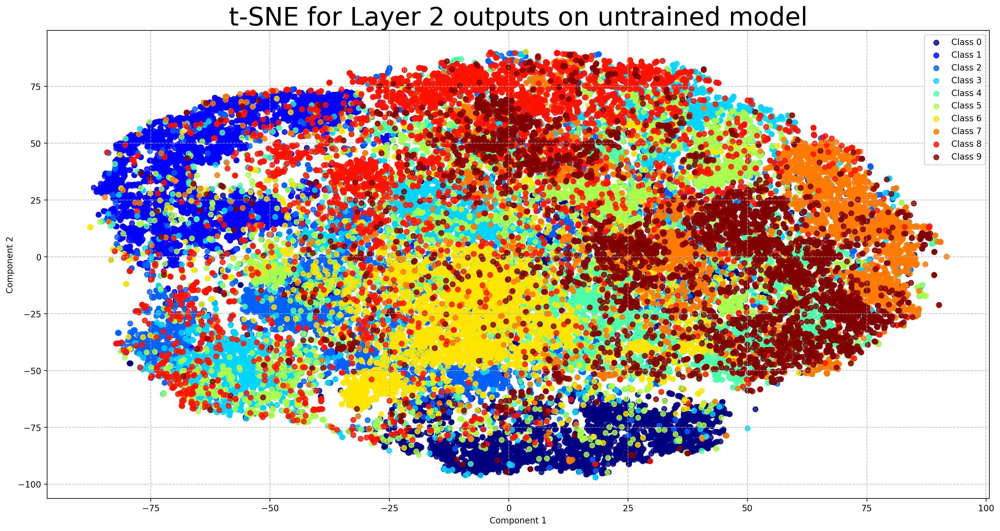

In [28]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Define unique colors for each class
unique_labels = np.unique(ylabels)
colors = plt.cm.jet(np.linspace(0, 1, len(unique_labels)))

# Plot t-SNE for trained model
tsne = TSNE(n_components=2, random_state=42)
transformed_components = tsne.fit_transform(outputs_layer2)

plt.figure(figsize=(20, 10))
plt.grid(linestyle='--', alpha=0.8)

for i, label in enumerate(unique_labels):
    indices = np.where(ylabels == label)
    plt.scatter(transformed_components[indices, 0],transformed_components[indices, 1],c=[colors[i]],label=f"Class {label}",alpha=0.8)

plt.title('t-SNE for Layer 2 outputs on trained model', size=30)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.legend()
plt.show()

# Plot t-SNE for untrained model
tsne = TSNE(n_components=2, random_state=42)
transformed_components = tsne.fit_transform(outputs_layer2_ut)

plt.figure(figsize=(20, 10))
plt.grid(linestyle='--', alpha=0.8)

for i, label in enumerate(unique_labels):
    indices = np.where(ylabels == label)
    plt.scatter(transformed_components[indices, 0],transformed_components[indices, 1],c=[colors[i]],label=f"Class {label}",alpha=0.8)

plt.title('t-SNE for Layer 2 outputs on untrained model', size=30)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.legend()
plt.show()


### TSNE on Fashion MNIST

In [29]:
transform = transforms.ToTensor()
train_data = datasets.FashionMNIST(root = 'data', train = True, download = True,transform=transform)
test_data = datasets.FashionMNIST(root = 'data', train = False, download = True,transform=transform)



samples = len(train_data)
index = np.random.permutation(samples)

split = int(np.floor(0.3*samples))
train_idxs  ,valid_idxs = index[split:],index[:split]

train_sampler = SubsetRandomSampler(train_idxs)
valid_sampler = SubsetRandomSampler(valid_idxs)

batch_size = 64
num_workers = 0

train_loader_fashion = torch.utils.data.DataLoader(train_data, batch_size=batch_size, sampler=train_sampler, num_workers=num_workers)
valid_loader_fashion = torch.utils.data.DataLoader(train_data, batch_size=batch_size, sampler=valid_sampler, num_workers=num_workers)
test_loader_fashion = torch.utils.data.DataLoader(test_data, batch_size=batch_size, num_workers=num_workers)


In [30]:
fashion_mnist_labels = {
    0: "T-shirt/top",
    1: "Trouser",
    2: "Pullover",
    3: "Dress",
    4: "Coat",
    5: "Sandal",
    6: "Shirt",
    7: "Sneaker",
    8: "Bag",
    9: "Ankle boot"
}

torch.Size([64, 1, 28, 28])
torch.Size([64])


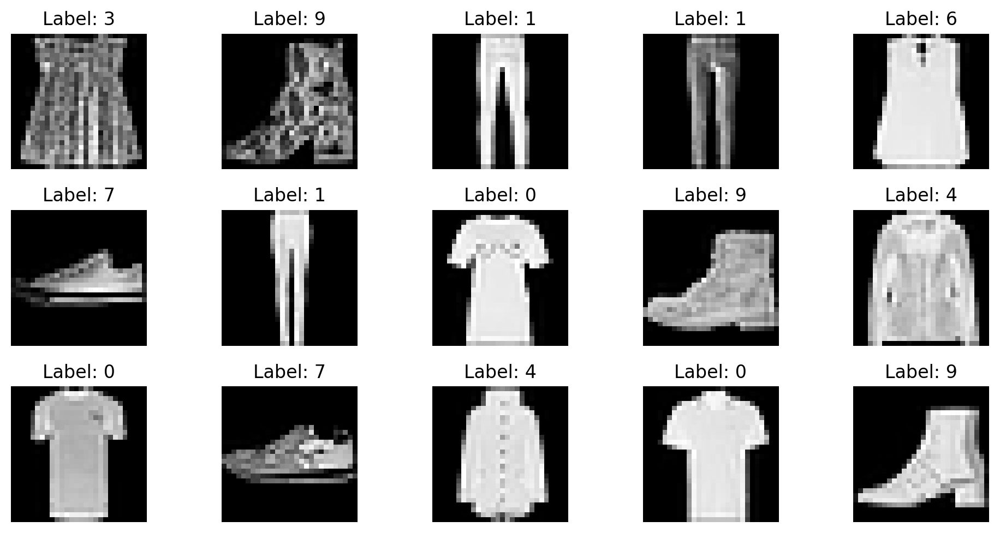

In [31]:
images, labels = next(iter(train_loader_fashion))

print(images.shape)
print(labels.shape)
# print(images,labels)

fig, axes = plt.subplots(3, 5, figsize=(10, 5))
axes = axes.flatten()

for i in range(15):
    axes[i].imshow(images[i].squeeze(), cmap='gray')
    axes[i].set_title(f'Label: {labels[i].item()}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

#### Trained on MNIST 

Test Accuracy: 0.0381
F1 Score: 0.0395
Macro Precision Score:  0.07048912909384417
Micro Precision Score:  0.07048912909384417
Weighted Precision Score:  0.07048912909384415
Confusion Matrix:


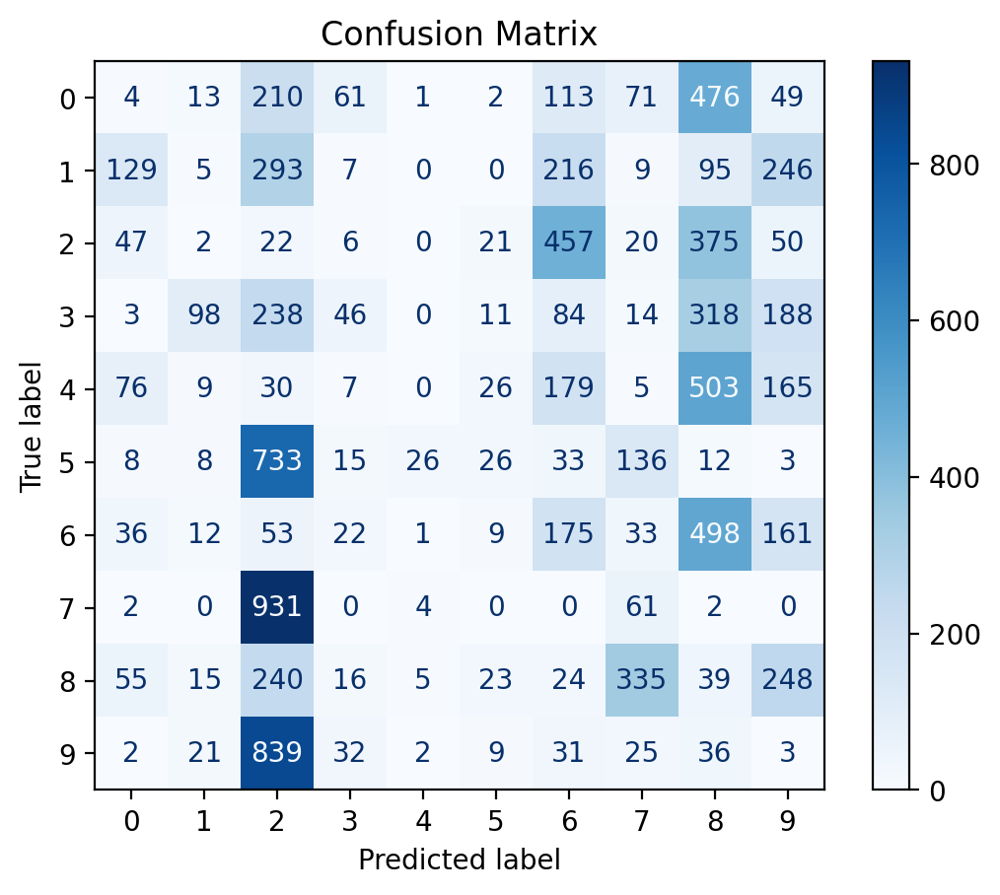

In [32]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, confusion_matrix
import pandas as pd

model.eval()
correct = 0
total = 0

all_labels = []
all_predictions = []

with torch.no_grad():
    for images, labels in test_loader_fashion:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        # print(outputs)
        max_logits, predicted = torch.max(outputs.data, 1)
        # print()

        total += labels.size(0)
        correct += (predicted == labels.squeeze()).sum().item()

        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())


test_accuracy = correct / total
print(f'Test Accuracy: {test_accuracy:.4f}')

f1 = f1_score(all_labels, all_predictions, average='weighted')
print(f'F1 Score: {f1:.4f}')


precision_macro = precision_score(all_labels,all_predictions,average='macro')
print("Macro Precision Score: ",precision_macro)

precision_micro = precision_score(all_labels,all_predictions,average='macro')
print("Micro Precision Score: ",precision_micro)

precision_weighted = precision_score(all_labels,all_predictions,average="weighted")
print("Weighted Precision Score: ",precision_weighted)



conf = confusion_matrix(all_labels, all_predictions)
print('Confusion Matrix:')

disp = ConfusionMatrixDisplay(confusion_matrix=conf)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


In [33]:
# images, labels = next(iter(train_loader))

# for i in range(len(images)):
#     print(images[i].shape)
#     print(labels[i])

model.eval()

outputs_layer2 = []
ylabels = []

with torch.no_grad():
    for images,labels in train_loader_fashion:
        for i,(image,label) in enumerate(zip(images,labels)):

            x = image.view(-1, 28*28)
            x = F.relu(model.fc1(x))
            x = model.fc2(x)

            outputs_layer2.append(x.squeeze().numpy())
            ylabels.append(label.numpy())



In [34]:
samples = -1

outputs_layer2 = np.array(outputs_layer2[:samples])
ylabels  = np.array(ylabels[:samples])

print(outputs_layer2.shape)

(41999, 20)


In [35]:
ylabels

array([2, 2, 0, ..., 1, 6, 0])

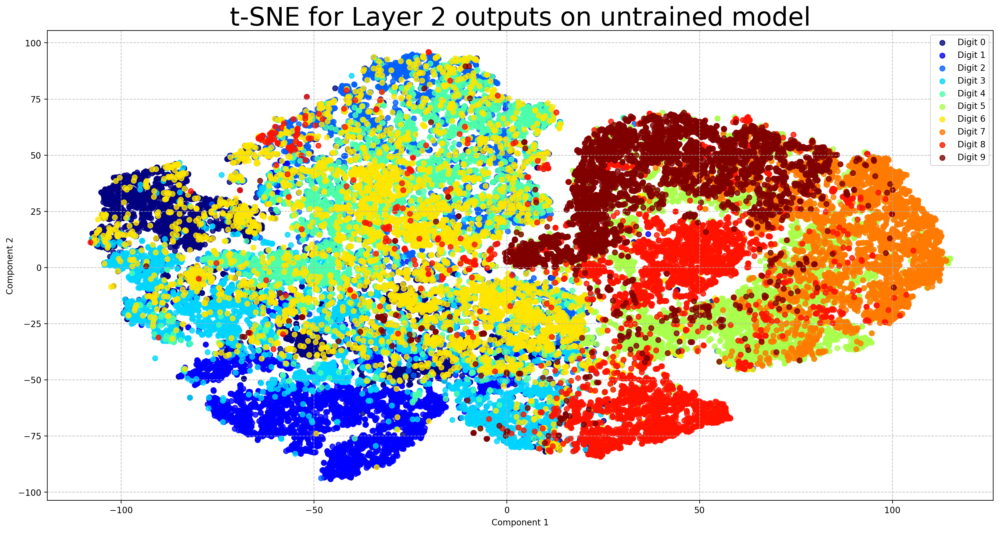

In [36]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
transformed_components = tsne.fit_transform(outputs_layer2)


plt.figure(figsize=(20, 10))
plt.grid(linestyle='--', alpha=0.8)

for i, label in enumerate(unique_labels):
    indices = np.where(ylabels == label)
    plt.scatter(transformed_components[indices, 0],transformed_components[indices, 1],c=[colors[i]],label=f"Digit {label}",alpha=0.8)

plt.title('t-SNE for Layer 2 outputs on untrained model', size=30)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.legend()
plt.show()


#### Trained on FMNIST 

In [37]:
'''
Defining the architecture of the model.

'''

import torch
from torch import nn
import torch.nn.functional as F
from torchsummary import summary


class MLP(nn.Module):
    def __init__(self,hidden_1,hidden_2):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(28*28, hidden_1)
        self.fc2 = nn.Linear(hidden_1, hidden_2)
        self.fc3 = nn.Linear(hidden_2, 10)

    def forward(self, x):
        x = x.view(-1, 28*28)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

model = MLP(30,20).to(device)
summary(model, input_size=(1, 28, 28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 30]          23,550
            Linear-2                   [-1, 20]             620
            Linear-3                   [-1, 10]             210
Total params: 24,380
Trainable params: 24,380
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.09
Estimated Total Size (MB): 0.10
----------------------------------------------------------------


In [38]:
'''
Setting up the optimizer and the loss function
'''
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [39]:
'''
Now we will train the model.
'''

epochs = 100

for epoch in range(epochs):
    model.train()
    curr_loss = 0.0

    for images, labels in train_loader_fashion:
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        curr_loss += loss.item()

    # Calculate average loss for this epoch
    avg_loss = curr_loss / len(train_loader_fashion)
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')

    # Validation step
    model.eval()  # Set the model to evaluation mode
    correct = 0
    total = 0

    with torch.no_grad():  # No gradient calculation during validation
        for images, labels in valid_loader_fashion:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            # print(outputs.shape)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    validation_accuracy = correct / total
    print(f'Validation Accuracy: {validation_accuracy:.4f}')

# Optionally, you can save the model after training
# torch.save(model.state_dict(), 'mlp_mnist.pth')

Epoch [1/100], Loss: 0.7409
Validation Accuracy: 0.8122
Epoch [2/100], Loss: 0.4804
Validation Accuracy: 0.8376
Epoch [3/100], Loss: 0.4405
Validation Accuracy: 0.8376
Epoch [4/100], Loss: 0.4186
Validation Accuracy: 0.8465
Epoch [5/100], Loss: 0.4020
Validation Accuracy: 0.8561
Epoch [6/100], Loss: 0.3864
Validation Accuracy: 0.8581
Epoch [7/100], Loss: 0.3732
Validation Accuracy: 0.8559
Epoch [8/100], Loss: 0.3629
Validation Accuracy: 0.8551
Epoch [9/100], Loss: 0.3527
Validation Accuracy: 0.8621
Epoch [10/100], Loss: 0.3435
Validation Accuracy: 0.8684
Epoch [11/100], Loss: 0.3359
Validation Accuracy: 0.8669
Epoch [12/100], Loss: 0.3278
Validation Accuracy: 0.8662
Epoch [13/100], Loss: 0.3204
Validation Accuracy: 0.8673
Epoch [14/100], Loss: 0.3135
Validation Accuracy: 0.8682
Epoch [15/100], Loss: 0.3106
Validation Accuracy: 0.8752
Epoch [16/100], Loss: 0.3013
Validation Accuracy: 0.8744
Epoch [17/100], Loss: 0.2976
Validation Accuracy: 0.8771
Epoch [18/100], Loss: 0.2946
Validation 

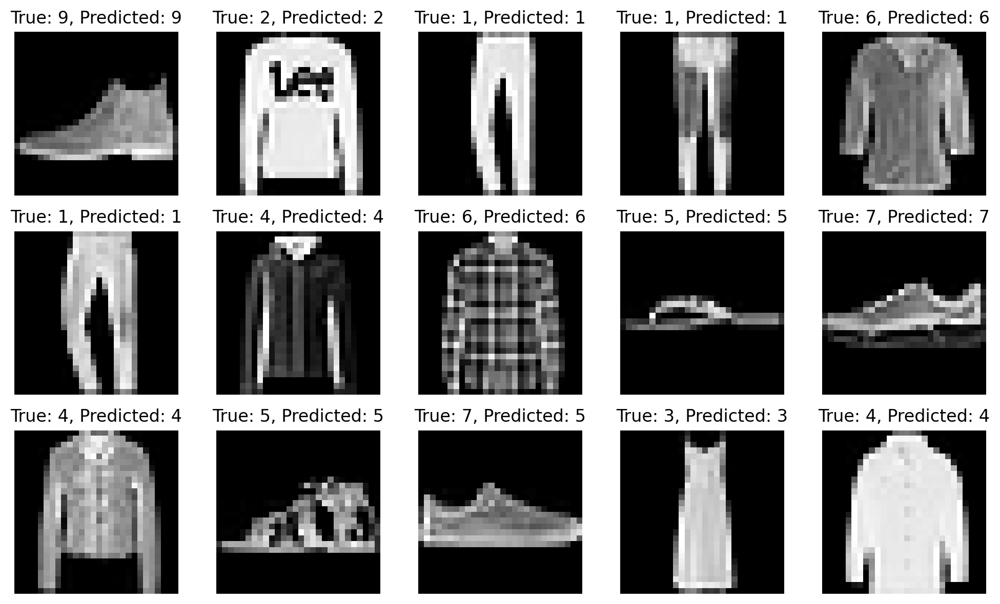

In [40]:
model.eval()

with torch.no_grad():

    for images, labels in test_loader_fashion:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)

        fig, axes = plt.subplots(3, 5, figsize=(10, 6))
        axes = axes.flatten()

        for i in range(15):
            axes[i].imshow(images[i].cpu().squeeze(), cmap='gray')
            axes[i].set_title(f'True: {labels[i].item()}, Predicted: {predicted[i].item()}')
            axes[i].axis('off')

        plt.tight_layout()
        plt.show()

        break

Test Accuracy: 0.8619
F1 Score: 0.8627
Macro Precision Score:  0.8653739580873483
Micro Precision Score:  0.8653739580873483
Weighted Precision Score:  0.8653739580873484
Confusion Matrix:


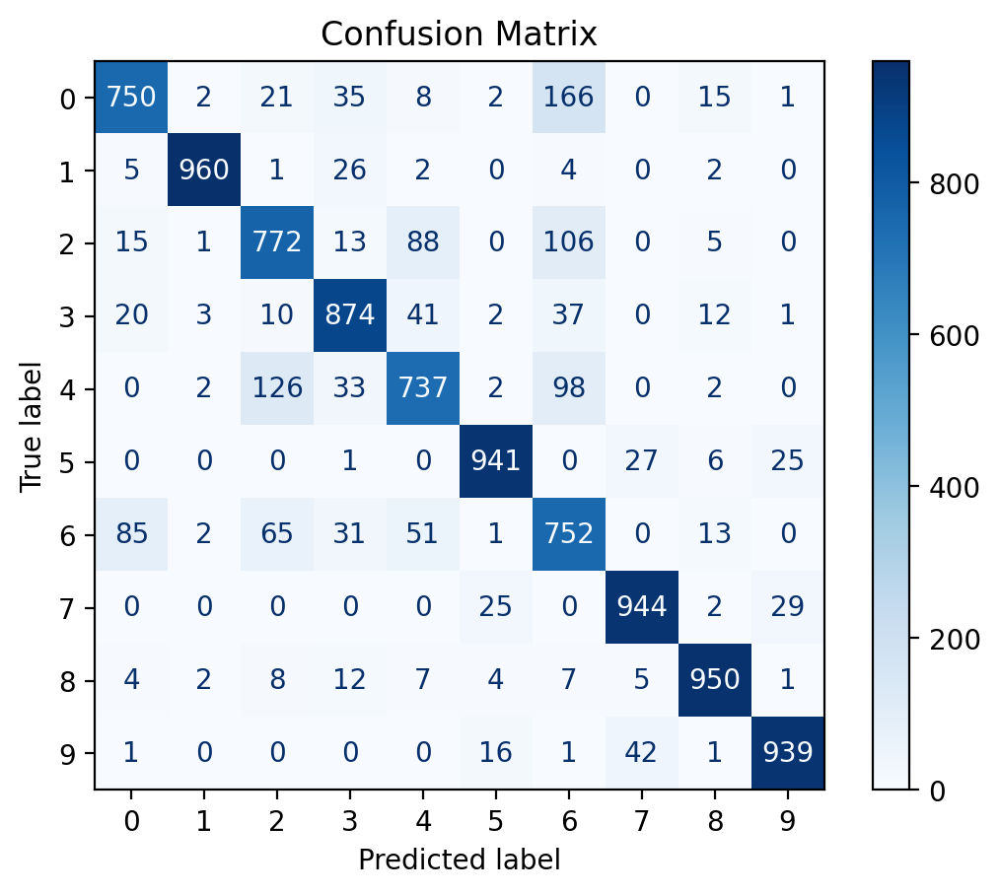

In [41]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, confusion_matrix
import pandas as pd

model.eval()
correct = 0
total = 0

all_labels = []
all_predictions = []

with torch.no_grad():
    for images, labels in test_loader_fashion:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        # print(outputs)
        max_logits, predicted = torch.max(outputs.data, 1)
        # print()

        total += labels.size(0)
        correct += (predicted == labels.squeeze()).sum().item()

        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())


test_accuracy = correct / total
print(f'Test Accuracy: {test_accuracy:.4f}')

f1 = f1_score(all_labels, all_predictions, average='weighted')
print(f'F1 Score: {f1:.4f}')


precision_macro = precision_score(all_labels,all_predictions,average='macro')
print("Macro Precision Score: ",precision_macro)

precision_micro = precision_score(all_labels,all_predictions,average='macro')
print("Micro Precision Score: ",precision_micro)

precision_weighted = precision_score(all_labels,all_predictions,average="weighted")
print("Weighted Precision Score: ",precision_weighted)


conf = confusion_matrix(all_labels, all_predictions)
print('Confusion Matrix:')

disp = ConfusionMatrixDisplay(confusion_matrix=conf)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


In [42]:
# images, labels = next(iter(train_loader))

# for i in range(len(images)):
#     print(images[i].shape)
#     print(labels[i])

model.eval()

outputs_layer2 = []
ylabels = []

with torch.no_grad():
    for images,labels in train_loader_fashion:
        for i,(image,label) in enumerate(zip(images,labels)):

            x = image.view(-1, 28*28)
            x = F.relu(model.fc1(x))
            x = model.fc2(x)

            outputs_layer2.append(x.squeeze().numpy())
            ylabels.append(label.numpy())



In [43]:
samples = -1

outputs_layer2 = np.array(outputs_layer2[:samples])
ylabels  = np.array(ylabels[:samples])

print(outputs_layer2.shape)

(41999, 20)


In [44]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
transformed_components = tsne.fit_transform(outputs_layer2)


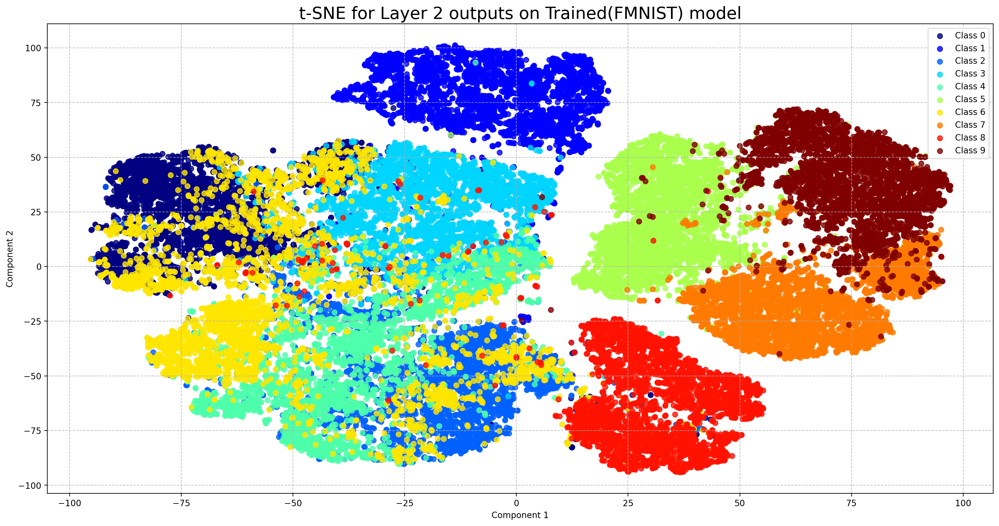

In [45]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt


unique_labels = np.unique(ylabels)
colors = plt.cm.jet(np.linspace(0, 1, len(unique_labels)))

plt.figure(figsize=(20, 10))
plt.grid(linestyle='--', alpha=0.8)

for i, label in enumerate(unique_labels):
    indices = np.where(ylabels == label)
    plt.scatter(transformed_components[indices, 0],transformed_components[indices, 1],c=[colors[i]],label=f"Class {label}",alpha=0.8)

plt.title('t-SNE for Layer 2 outputs on Trained(FMNIST) model', size=20)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.legend()
plt.show()